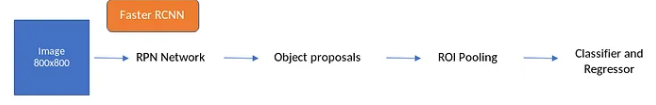

Estructura de una Faster-Rcnn, donde tenemos como entrada nuestras imagenes.
1. Pasa por un backbone que se puede establecer como un vgg-16 o una resnet estas se usan para poder realizar una extraccion de caracteristicas, con lo cual se obtiene un mapa de caracteristicas y es la que se le pasa a la siguiente fase.
2. La siguiente fase es una capa de RPN la cual es una red pequeña la cual toma ese mapa de caracteristicas generado, y produce las regiones de interes, funcionando de manera en la cual se desliza por los pixeles, haciendo que genere multiples cajas de diferentes tamaños y posiciones.
3. Despues de obtener esas regiones de interes tenemos una capa de RoI Pooling, donde se le va a aplicar al mapa de caracteristicas original, y despues se extraen caracteristicas fijas de cada region propuesta, convirtiendo las representaciones de caracteristicas como regiones fijas.
4. Por ultimo se tiene la red que permite realizar la clasificacion y la regression de esos bounding boxes encontrados, donde las caracteristicas extraidas por cada region es procesada por una serie de capaz, una rama cuenta con un softmax para obtener esa probabilidad de cada clase y la otra para la regression

In [ ]:
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt
import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
from torchvision.models import resnet18, ResNet18_Weights
import torch.nn as nn
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torch.nn.functional as F

In [ ]:
!unzip /content/gunniest.zip

Archive:  /content/gunniest.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/armas-100-_jpg.rf.ec49bb2e9578431e04ecdb482b4c50b7.jpg  
 extracting: test/armas-100-_jpg.rf.ec49bb2e9578431e04ecdb482b4c50b7.xml  
 extracting: test/armas-104-_jpg.rf.5243e6eda30e96eaedcd8e7b99e6187c.jpg  
 extracting: test/armas-104-_jpg.rf.5243e6eda30e96eaedcd8e7b99e6187c.xml  
 extracting: test/armas-112-_jpg.rf.a6fe116ac1ecc056cec0882a900271cc.jpg  
 extracting: test/armas-112-_jpg.rf.a6fe116ac1ecc056cec0882a900271cc.xml  
 extracting: test/armas-113-_jpg.rf.769e699c51e5a656cbeee4a2fad3b49e.jpg  
 extracting: test/armas-113-_jpg.rf.769e699c51e5a656cbeee4a2fad3b49e.xml  
 extracting: test/armas-12-_jpg.rf.10e7a7dc6a0e368466a5624d8e541301.jpg  
 extracting: test/armas-12-_jpg.rf.10e7a7dc6a0e368466a5624d8e541301.xml  
 extracting: test/armas-128-_jpg.rf.5f95f15a2ff6ba96951e75b2c9d69930.jpg  
 extracting: test/armas-128-_jpg.rf.5f95f15a2ff6ba

In [ ]:
def read_content(xml):
  tree = ET.parse(xml)
  root = tree.getroot()
  list_boxes = []

  for boxes in root.iter("object"):
    filename = root.find("filename").text

    ymin, xmin, ymax, xmax = None, None, None, None
    ymin = int(boxes.find("bndbox/ymin").text)
    xmin = int(boxes.find("bndbox/xmin").text)
    ymax = int(boxes.find("bndbox/ymax").text)
    xmax = int(boxes.find("bndbox/xmax").text)

    list_single_boxes = [xmin,ymin,xmax,ymax]
    list_boxes.append(list_single_boxes)
  return filename, list_boxes



In [ ]:
def cargar_imagenes(path):
    files = glob.glob(path + "/*xml", recursive=True)
    x = []
    y = []
    transform = transforms.ToTensor()
    for file in files:
        name, boxes = read_content(file)
        img_cv = cv2.imread(path + name)
        img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
        (h, w) = img_cv.shape[:2]
        xmin = float(boxes[0][0]) / w
        ymin = float(boxes[0][1]) / h
        xmax = float(boxes[0][2]) / w
        ymax = float(boxes[0][3]) / h
        y.append((xmin, ymin, xmax, ymax))

        img_tensor = transform(img_cv)
        x.append(img_tensor)

    x = torch.stack(x)  # Stack tensors into a single tensor
    y = torch.tensor(y, dtype=torch.float32)

    return x, y


In [ ]:
class BoundingBoxDataset(Dataset):
    def __init__(self, path, transform=None):
        self.path = path
        self.transform = transform
        self.x_tensor, self.y_tensor = cargar_imagenes(path)

    def __len__(self):
        return len(self.x_tensor)

    def __getitem__(self, idx):
        image = self.x_tensor[idx]
        bboxes = self.y_tensor[idx]

        if self.transform:
            image = self.transform(image)

        return image, bboxes

In [ ]:
dataset = BoundingBoxDataset(path='/content/test/')
data_loader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
class BoundingBox(nn.Module):
  def __init__(self, num_classes=1):
    super(BoundingBox, self).__init__()
    self.backbone = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
    num_ftrs = self.backbone.fc.in_features
    self.backbone.fc = nn.Linear(num_ftrs, num_classes *4)
    self.relu = nn.ReLU()

  def forward(self,x):
    x = self.relu(self.backbone(x))
    return x.view(-1,4)


In [ ]:
num_epochs = 50
# Create an instance of the model
model = BoundingBox()
n_total_steps = len(data_loader)
# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
for epoch in range(num_epochs):
    for i, (images, bboxes) in enumerate(data_loader):
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, bboxes)
        loss.backward()
        optimizer.step()
        if (i+1) % 1 == 0:
            print (f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{n_total_steps}], Loss: {loss.item():.4f}')

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 152MB/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch [1/50], Step [1/1], Loss: 0.1133
Epoch [2/50], Step [1/1], Loss: 1.2318
Epoch [3/50], Step [1/1], Loss: 0.3379
Epoch [4/50], Step [1/1], Loss: 0.2597
Epoch [5/50], Step [1/1], Loss: 0.2339
Epoch [6/50], Step [1/1], Loss: 0.2164
Epoch [7/50], Step [1/1], Loss: 0.2300
Epoch [8/50], Step [1/1], Loss: 0.2107
Epoch [9/50], Step [1/1], Loss: 0.1943
Epoch [10/50], Step [1/1], Loss: 0.1679
Epoch [11/50], Step [1/1], Loss: 0.1629
Epoch [12/50], Step [1/1], Loss: 0.1485
Epoch [13/50], Step [1/1], Loss: 0.1484
Epoch [14/50], Step [1/1], Loss: 0.1439
Epoch [15/50], Step [1/1], Loss: 0.1424
Epoch [16/50], Step [1/1], Loss: 0.1345
Epoch [17/50], Step [1/1], Loss: 0.1251
Epoch [18/50], Step [1/1], Loss: 0.1212
Epoch [19/50], Step [1/1], Loss: 0.1210
Epoch [20/50], Step [1/1], Loss: 0.1199
Epoch [21/50], Step [1/1], Loss: 0.1168
Epoch [22/50], Step [1/1], Loss: 0.1076
Epoch [23/50], Step [1/1], Loss: 0.1068
Epoch [24/50], Step [1/1], Loss: 0.1134
Epoch [25/50], Step [1/1], Loss: 0.1097
Epoch [26

0 0 0 530


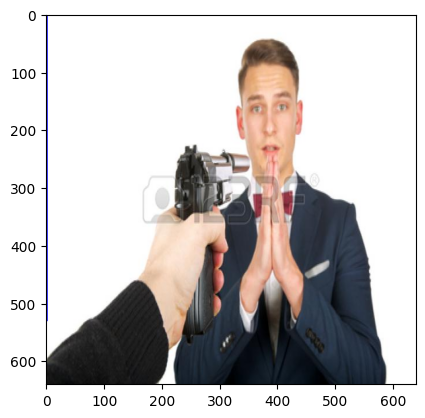

0 241 432 549


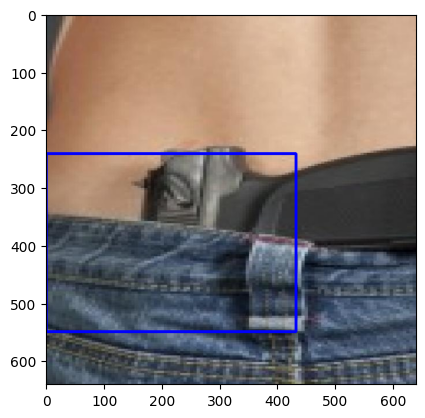

0 312 195 423


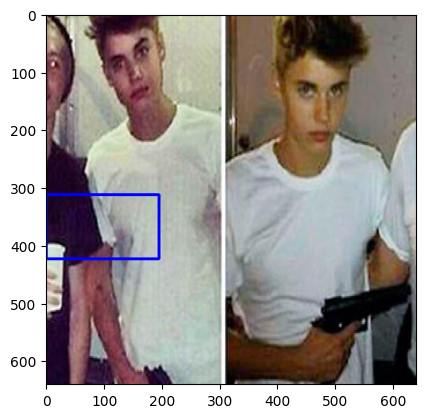

0 0 0 0


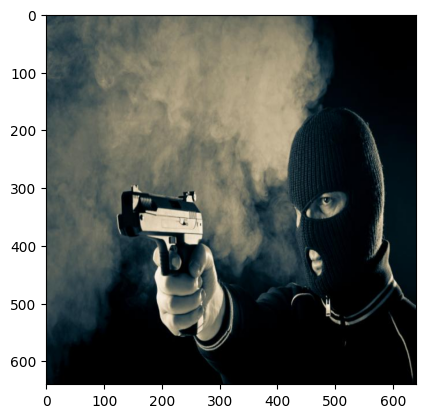

0 317 31 288


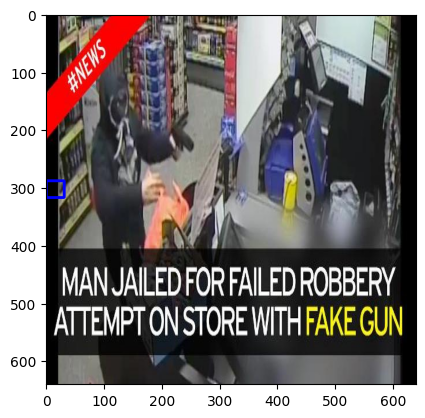

0 0 273 520


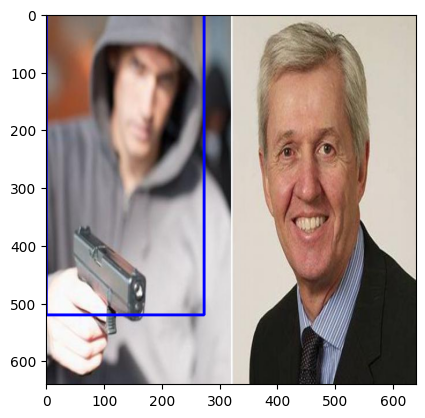

0 374 541 563


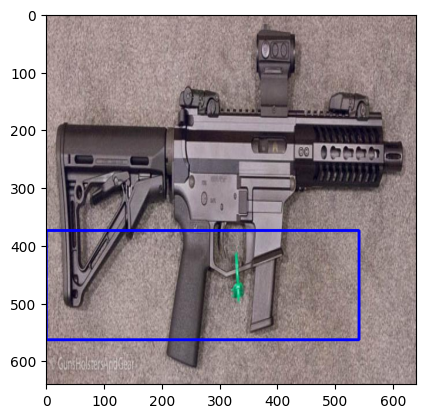

0 197 195 390


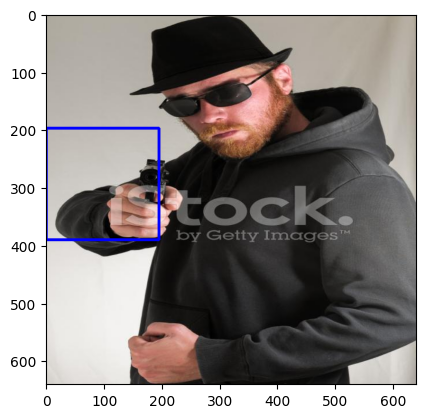

0 0 411 693


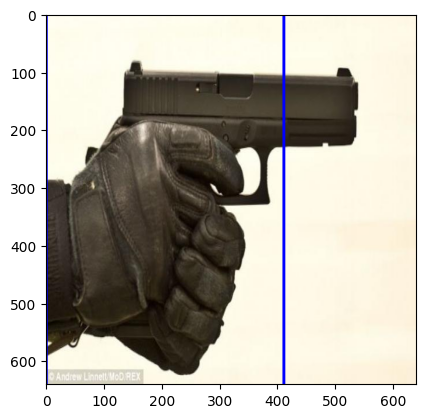

0 0 271 562


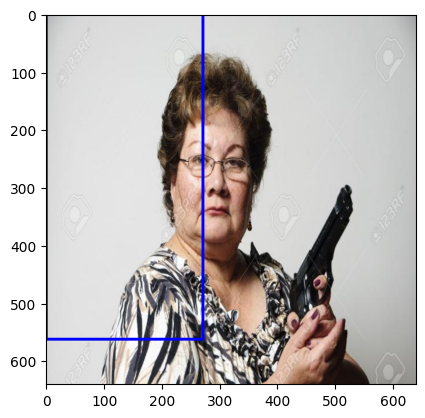

0 300 455 375


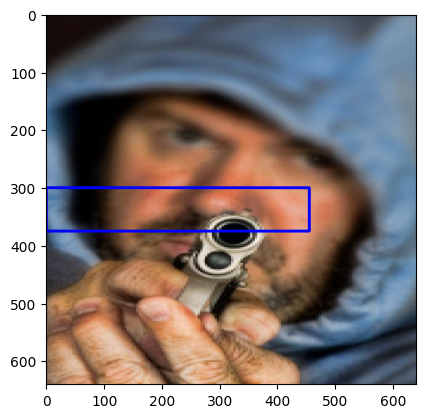

0 0 0 0


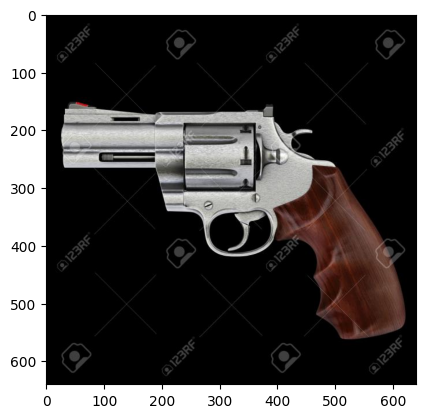

0 163 48 335


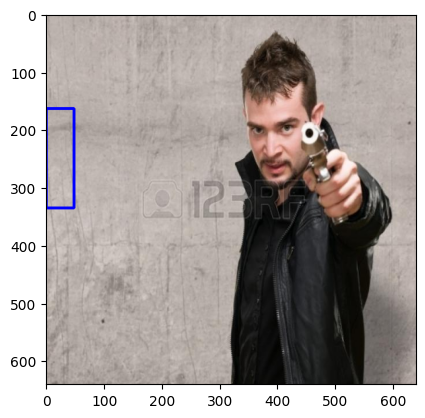

0 0 0 0


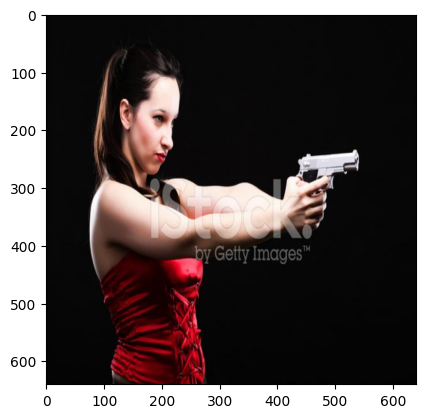

0 0 0 0


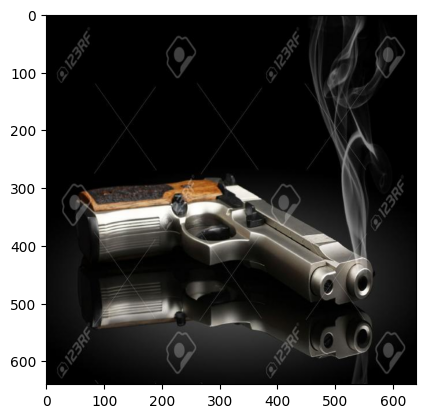

0 297 393 650


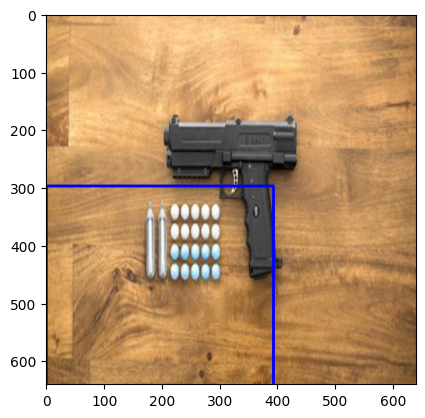

0 0 0 65


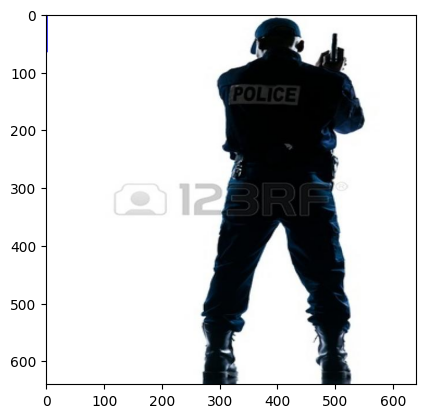

0 0 178 637


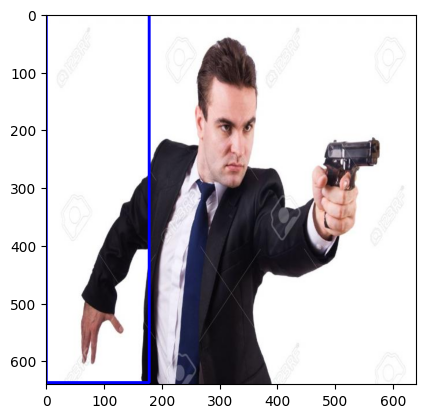

0 353 238 434


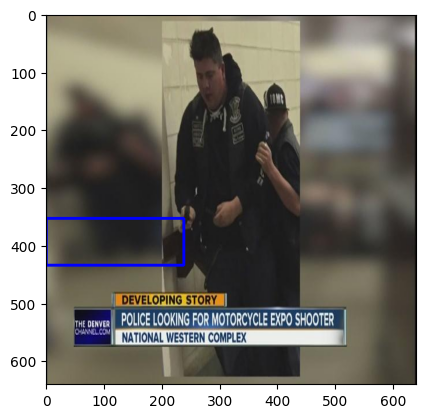

0 264 539 691


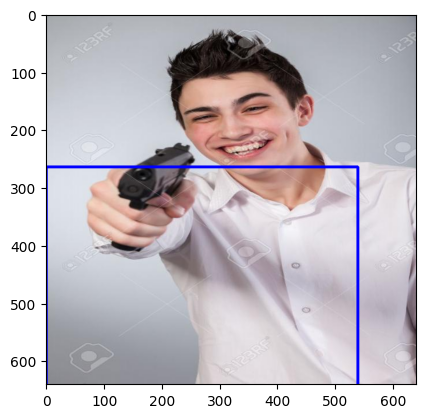

0 320 395 346


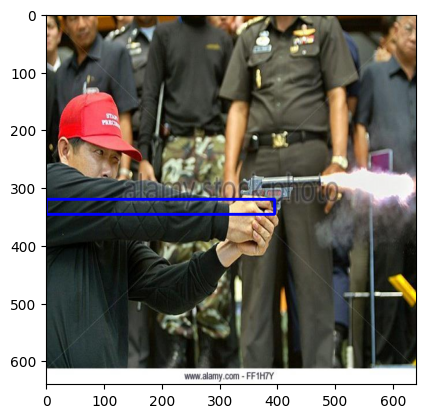

0 367 360 48


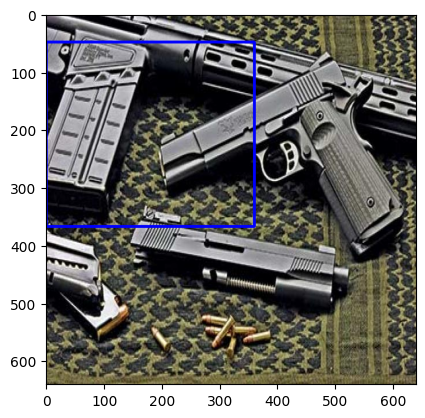

0 0 0 0


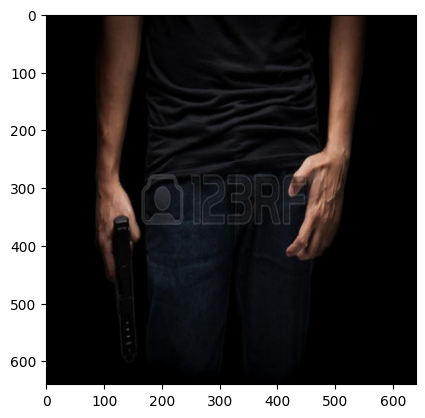

0 0 0 0


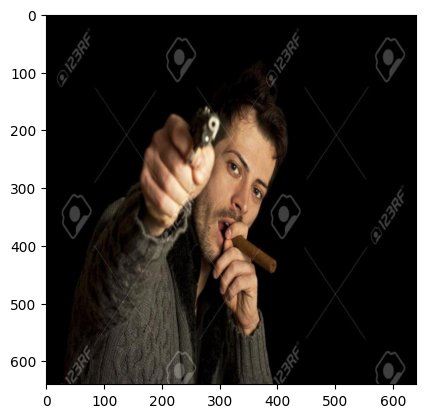

0 0 245 633


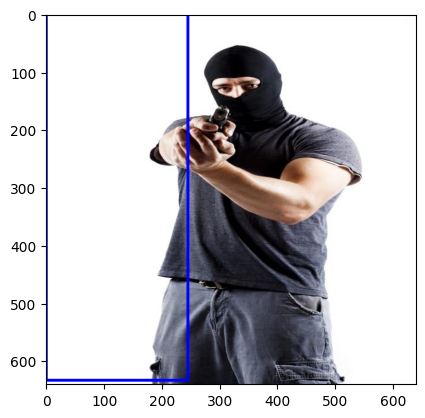

0 137 283 348


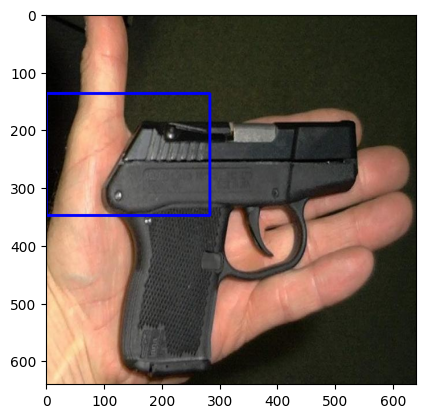

0 0 383 734


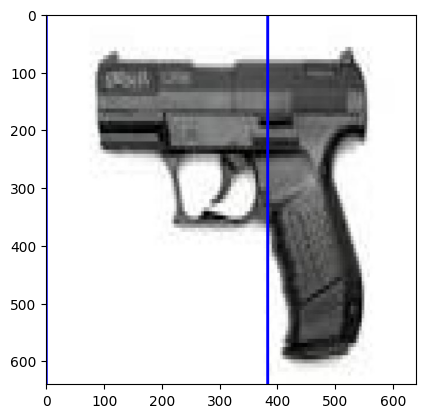

0 0 172 614


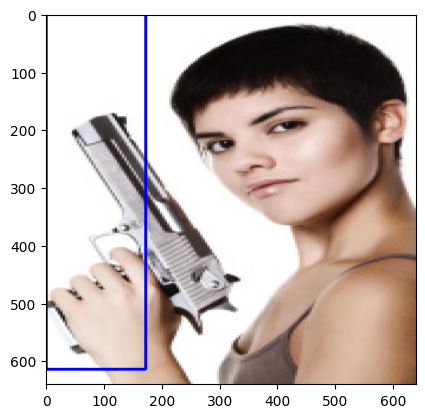

0 0 0 0


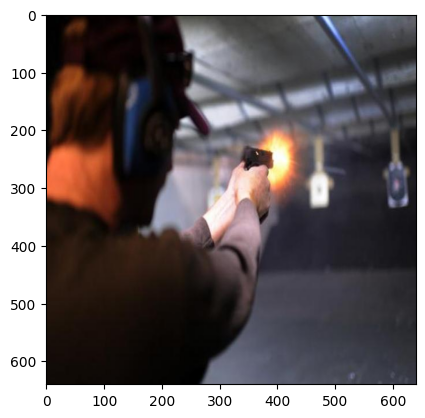

0 0 355 756


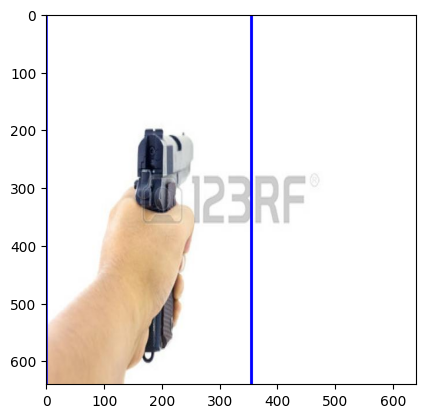

0 264 132 446


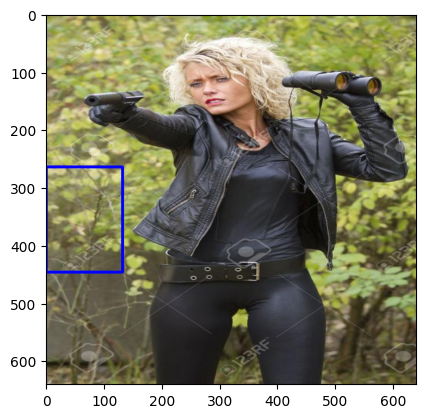

0 0 0 0


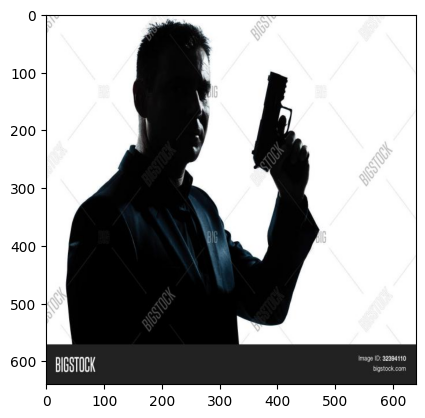

0 0 0 0


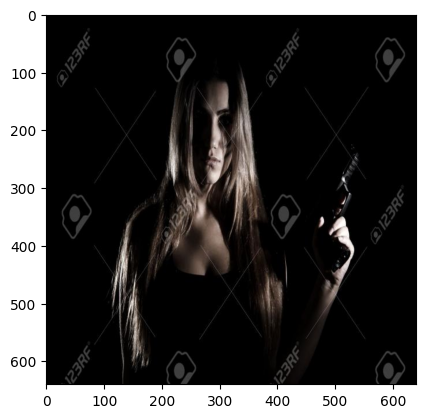

0 0 18 339


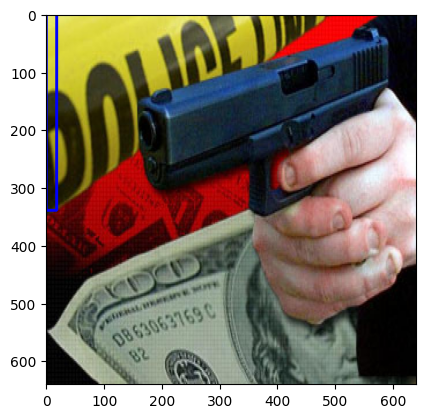

0 0 0 0


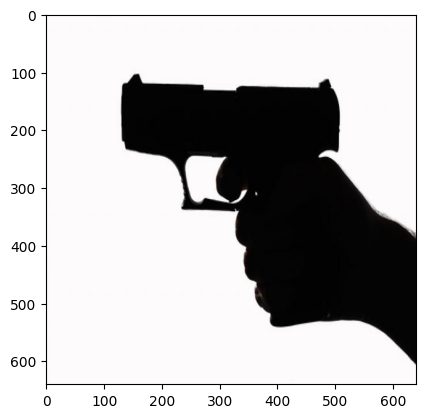

0 135 46 160


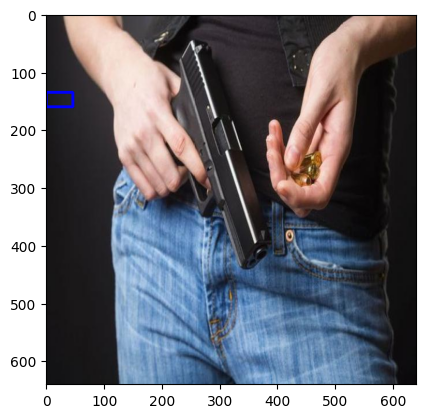

0 0 568 717


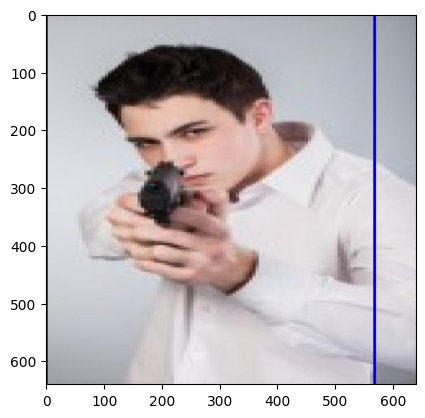

0 308 319 563


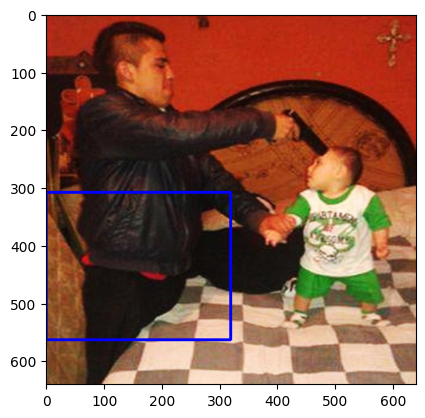

0 108 549 692


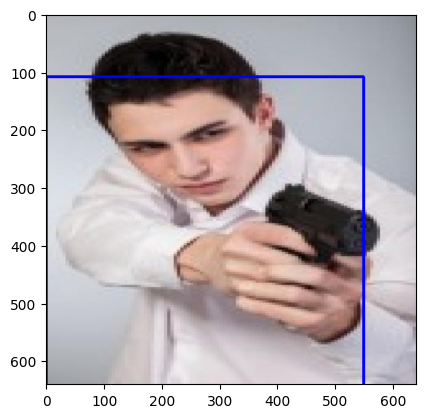

0 0 0 0


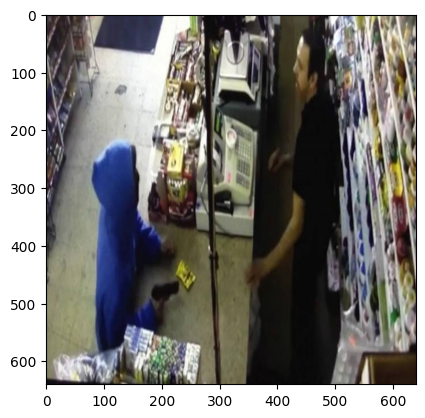

0 0 0 0


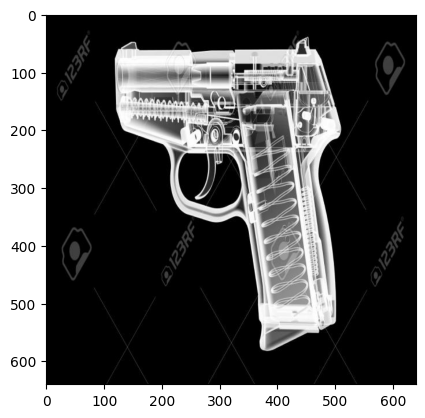

0 271 223 317


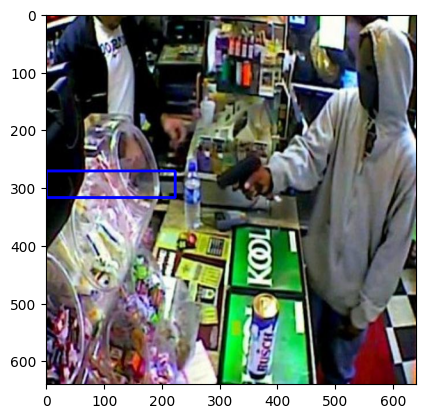

0 0 0 0


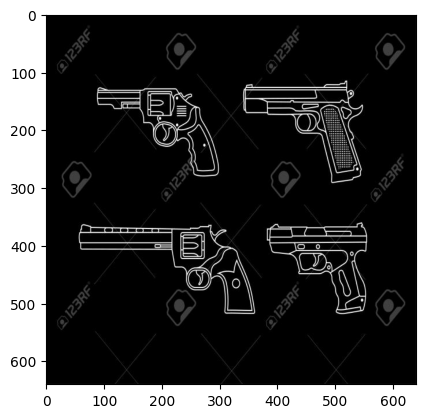

0 0 0 0


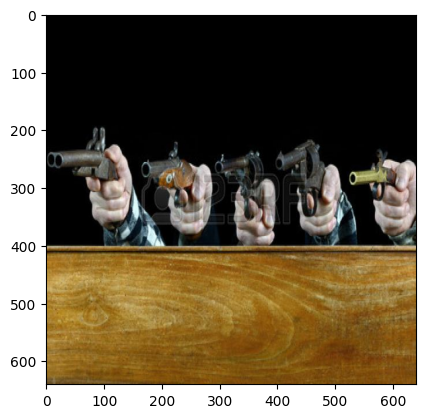

0 0 0 0


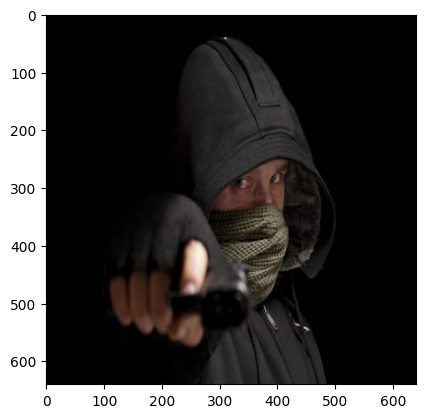

0 171 312 582


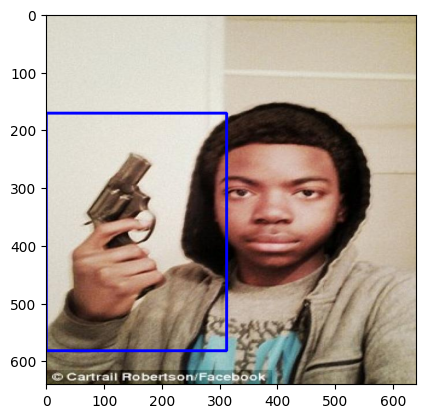

0 0 428 637


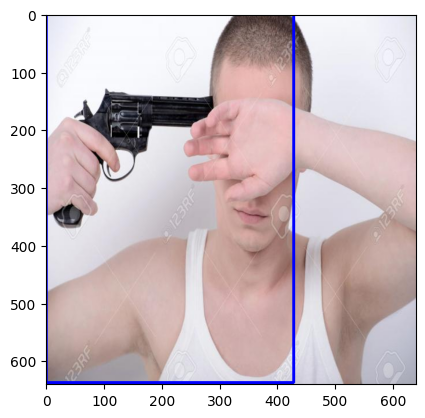

0 0 0 222


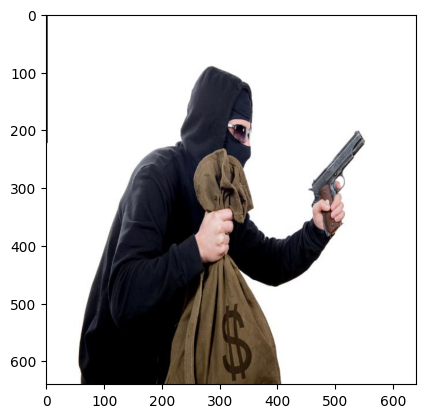

0 0 0 0


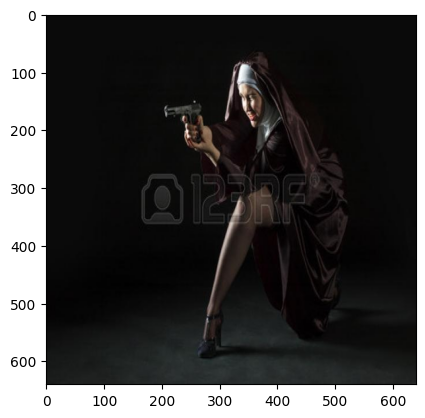

0 0 0 0


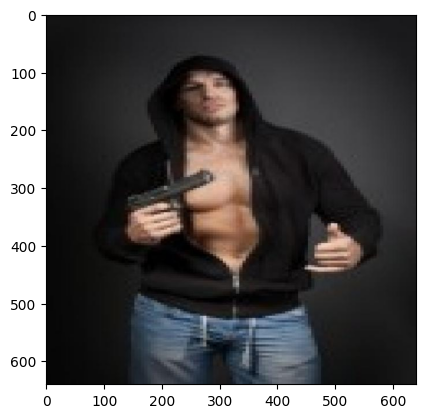

0 122 116 260


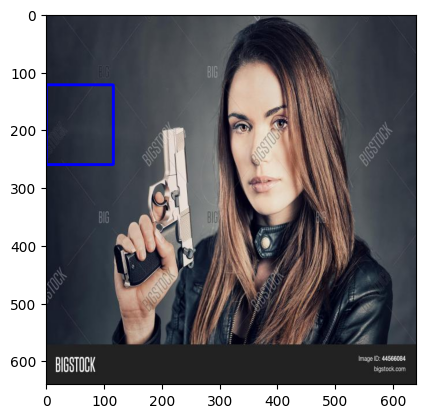

0 0 0 320


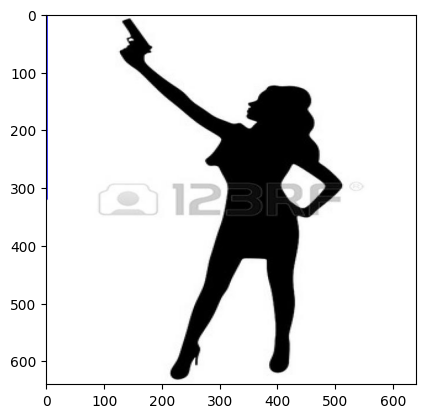

0 0 0 0


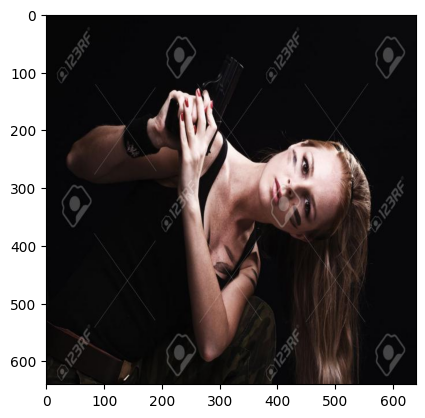

0 0 619 527


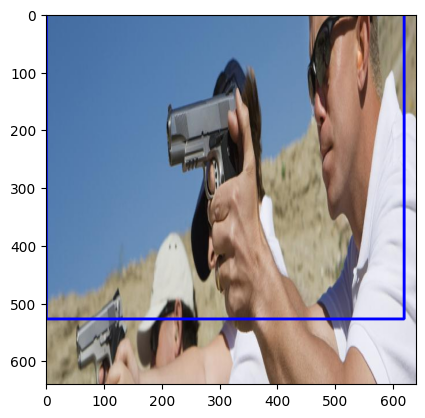

0 285 490 492


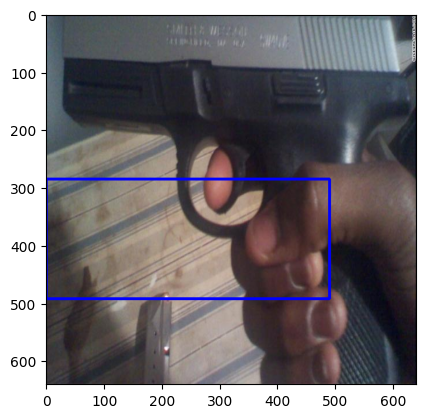

0 0 415 657


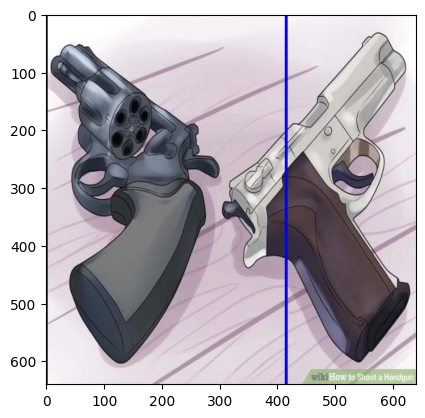

0 295 316 317


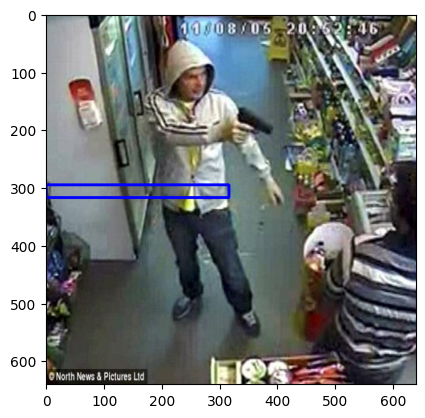

0 286 327 616


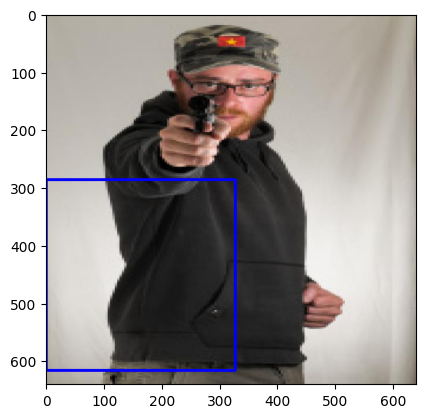

0 0 0 0


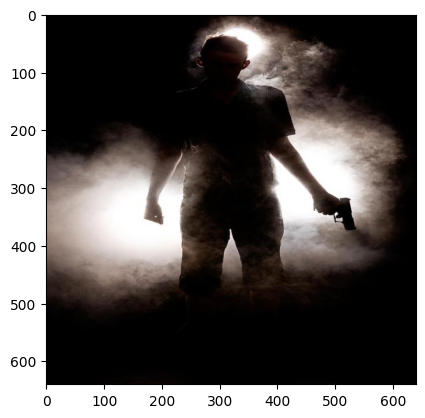

0 0 0 0


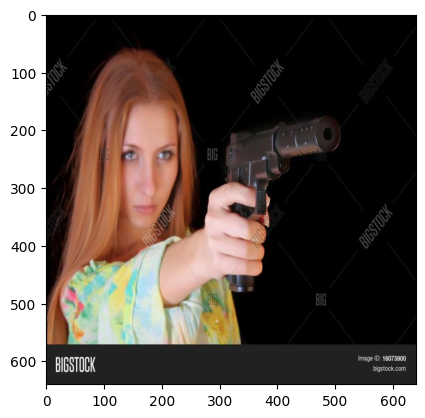

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device)
model.eval()

files = glob.glob("/content/valid/*.xml", recursive=True)
transform = transforms.ToTensor()

for file in files:
    name, boxes = read_content(file)
    img_cv = cv2.imread("/content/valid/" + name)
    img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
    (h, w) = img_cv.shape[:2]

    img_tensor = transform(img_cv).unsqueeze(0).to(device)  # Add batch dimension and move to device

    with torch.no_grad():
        preds = model(img_tensor)[0].cpu().numpy()  # Move prediction back to CPU for post-processing

    xmin = int(preds[0] * w)
    ymin = int(preds[1] * h)
    xmax = int(preds[2] * w)
    ymax = int(preds[3] * h)
    print(xmin,ymin,xmax,ymax)


    cv2.rectangle(img_cv, (xmin, ymin), (xmax, ymax), (0, 0, 255), 4)
    plt.imshow(img_cv)
    plt.show()
